In [1]:
from comet_ml import Experiment
from jupyterplot import ProgressPlot
from asset.utils import *
%matplotlib inline
dtype = torch.FloatTensor

torch.utils.backcompat.broadcast_warning.enabled = True
torch.manual_seed(1)
if torch.cuda.is_available():
    torch.cuda.manual_seed(1)
torch.cuda.empty_cache()

rand.seed(1)

np.random.seed(1)

cuda_devices = list()

infrencePhase=True
resolution=128
seqLength=20
maxResultSpeed=4
minResultSpeed=2
avDev = torch.device("cpu")
if torch.cuda.is_available(): #Change this block if you want to use GPU
    cuda_devices = [1] #Your GPU Number
    avDev = torch.device("cuda:"+str(cuda_devices[0]))
    if(len(cuda_devices) > 0):
        torch.cuda.set_device(cuda_devices[0])
batch_multiplier = max(len(cuda_devices), 1)


NOTVALID=cv2.resize(cv2.imread('asset/notValid.jpg')[:,:,1], dsize=(resolution-2, resolution-2), 
                                     interpolation=cv2.INTER_CUBIC)
NOTVALID=cv2.copyMakeBorder(NOTVALID, 1, 1, 1, 1, cv2.BORDER_CONSTANT, None, 0)
NOTVALID=torch.from_numpy(NOTVALID).unsqueeze(0).to(avDev).float()/255.

Files already downloaded and verified
Init worker seed: 1
torch.Size([100, 1, 20, 128, 128]) torch.FloatTensor tensor([1]) tensor([[[ 3., -4.]]], dtype=torch.float64)
Data: min and max 0.0 1.0


<b><span style="color: #ff0000">initailSeq (r)</span></b>  (1, 20, 128, 128, 1)

Image: min and max 0.0 1.0


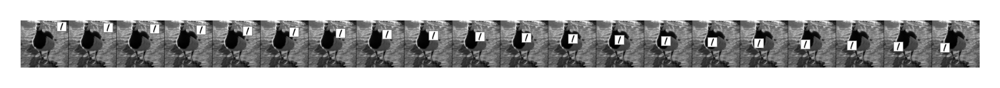

Data: min and max 0.0 1.0
Data[ 0 ]: min and max 0.005882353 1.0
Data[ 1 ]: min and max 0.0 0.99607843
Data[ 2 ]: min and max 0.0 1.0


<b><span style="color: #ff0000">initailSeq (r)</span></b>  (1, 20, 530, 128, 1)

Image: min and max 0.0 1.0


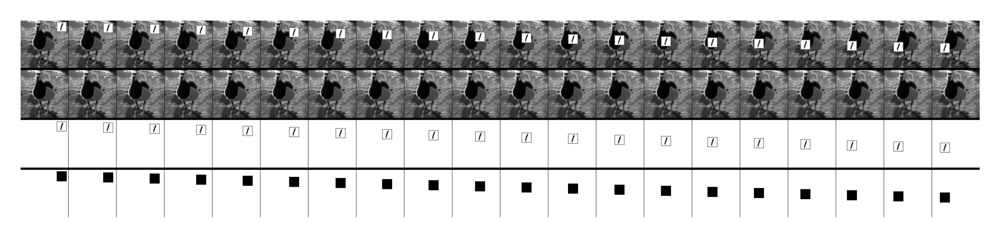

Data: min and max -1.0 1.0


<b><span style="color: #ff0000">rotA (N) (r)</span></b>  (1, 2, 128, 128, 1)

Image: min and max 0.0 1.0


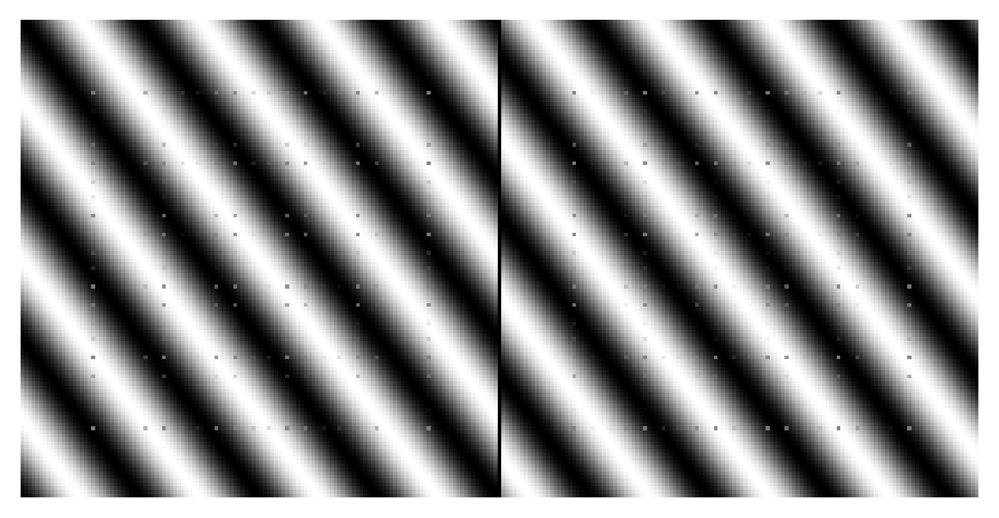

Data: min and max -1.0 1.0


<b><span style="color: #ff0000">rotFG (N) (r)</span></b>  (1, 2, 128, 128, 1)

Image: min and max 0.0 1.0


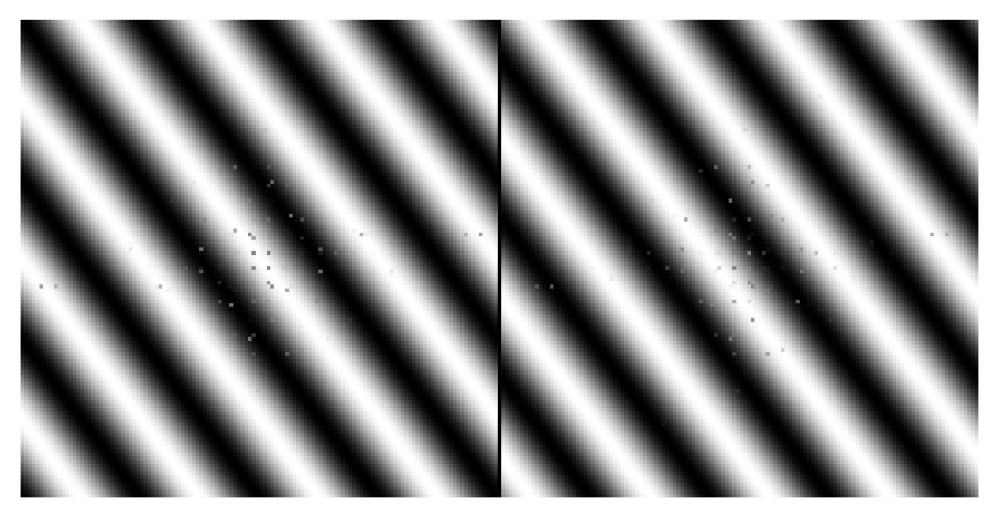

Data: min and max -1.0 1.0


<b><span style="color: #ff0000">rotTFG (N) (r)</span></b>  (1, 2, 128, 128, 1)

Image: min and max 0.0 1.0


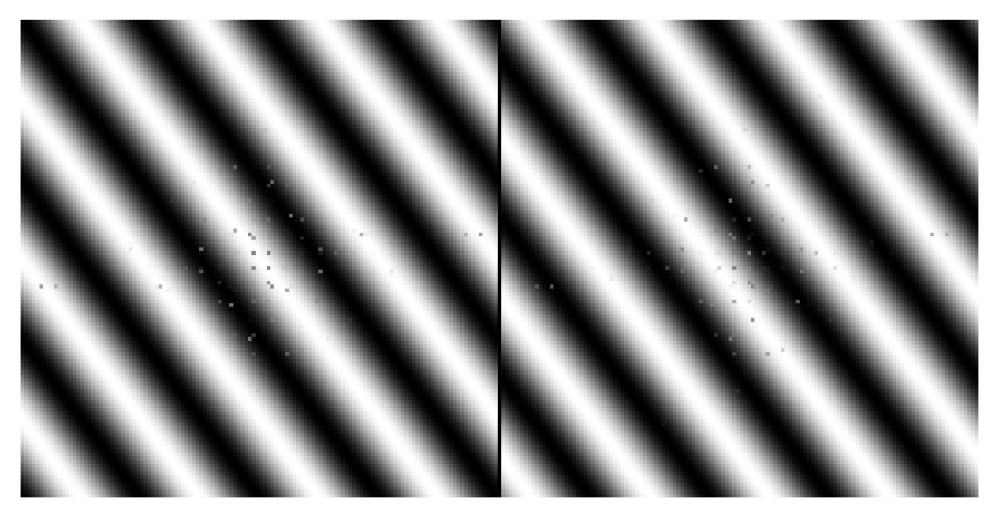

In [2]:
bs=100
def worker_init_fn(worker_id):  
    worker_id=worker_id+1
    print("Init worker seed:",worker_id)
    torch.manual_seed(worker_id)
    if torch.cuda.is_available():
        torch.cuda.manual_seed(worker_id)
    rand.seed(worker_id)
    np.random.seed(worker_id)
    
ds = MovingFGOnBGDataset(infrencePhase=infrencePhase,seqLength=seqLength,shape=resolution,minResultSpeed=minResultSpeed,maxResultSpeed=maxResultSpeed,foregroundScale=1,background="STL10",foreground="MNIST")
ds_loader = DataLoader(ds,batch_size=bs, shuffle=not infrencePhase,num_workers=1,worker_init_fn=worker_init_fn)
for s in ds_loader:
    li=5;ui=li+1
    print(s['GT'].shape,s['GT'].type(),s['foreground'][li:ui],s["velocity"][li:ui])
    showSeq(False,-1,"initailSeq",s['GT'][li:ui].cpu(),oneD=False,dpi=3,revert=True)
    dataSet=s['GT'].to(avDev)
    dsBG=s['BG'].to(avDev)
    dsFG=s['FG'].to(avDev)
    dsAlpha=s['A'].to(avDev)
    showSeq(False,-1,"initailSeq",dataSet[li:ui].cpu(),[dsBG[li:ui].cpu(),dsFG[li:ui].cpu(),dsAlpha[li:ui].cpu()],oneD=dimention==1,dpi=3,revert=True)
    rotA,rotFG,rotTFG=generateAllRot(dsAlpha,dsFG)
    showSeq(True,1,"rotA",rotA.view(bs,resolution, resolution,2).permute(0,3,1,2).unsqueeze(1).cpu()[li:ui],revert=True)
    showSeq(True,1,"rotFG",rotFG.view(bs,resolution, resolution,2).permute(0,3,1,2).unsqueeze(1).cpu()[li:ui],revert=True)
    showSeq(True,1,"rotTFG",rotTFG.view(bs,resolution, resolution,2).permute(0,3,1,2).unsqueeze(1).cpu()[li:ui],revert=True)
    break

In [3]:
PAD=0

AI=False
def occludedDS(ds,val=0,dim=5):
    return ds.clone()

def padDS(ds):
    return torch.nn.functional.pad(ds,(0,0,PAD,PAD,PAD,PAD))

class Conv_RAE(torch.nn.Module):
    def __init__(self,batchSize, in_channels, out_channels, m_channels, kernel_size,layer):
        super().__init__()
        self.layer=layer
        self.conv2d_layer_u1 = torch.nn.Conv2d(in_channels=in_channels, out_channels=out_channels, kernel_size=kernel_size, stride=1, padding=(kernel_size-2)//2+1, bias= True) # u1 #default bias = True
        self.conv2d_layer_u2 = torch.nn.Conv2d(in_channels=in_channels, out_channels=out_channels, kernel_size=kernel_size, stride=1, padding=(kernel_size-2)//2+1, bias= True) # u2
        
        self.conv2d_layer_w = torch.nn.Conv2d(in_channels=out_channels, out_channels=m_channels, kernel_size=1, stride=1, padding=0, dilation=1, bias = True)# w1

        self.conv2d_layer_w2 = torch.nn.Conv2d(in_channels=m_channels, out_channels=out_channels, kernel_size=1, stride=1, padding=0, dilation=1, bias= True)# w2
        self.deconv2d_layer_u2T = torch.nn.ConvTranspose2d(in_channels=out_channels, out_channels=1, kernel_size=kernel_size, stride=1, padding=(kernel_size-1)//2, output_padding=0, bias =True)

#         self.deconv2d_layer_u2T.weight = self.conv2d_layer_u2.weight

        for _i in self.modules():
            if isinstance(_i, torch.nn.Conv2d):
                torch.nn.init.orthogonal_(_i.weight.data)
        self.m = None
        self.m_prim = None

        self.nonlin = torch.nn.Sigmoid()
        self.nonlinRelu = torch.nn.ReLU()
        if AI: 
            self.locationEncode=torch.zeros(1,2,resolution,resolution)#:,:,:,minStep:maxStep,:
            for i in range(resolution):
                self.locationEncode[0,1,:,i]=self.locationEncode[0,0,i,:]=i/float(resolution-1)
     

    def forward(self, x, y):
        if x is None:
            print("Programming Error")
        if AI:    
            if self.locationEncode.device != x.device:
                self.locationEncode=self.locationEncode.to(x.get_device())

        if(self.layer<1):    
            if not AI:
                xtmp=x
            else:
                xtmp=torch.cat((x,self.locationEncode.repeat(x.shape[0],1,1,1)),dim=1)
        else:
            xtmp=x
        self.cor_x1 = gaussian_noise(xtmp, is_training=y is not None)
        self.f_cor_x = self.conv2d_layer_u1(self.cor_x1)

        if(self.m is not None):
            self.m_prim = self.m.clone()
        if(y is not None):
            if(self.layer<1):  
                if not AI:
                    ytmp=y
                else:
                    ytmp=torch.cat((y,self.locationEncode.repeat(y.shape[0],1,1,1)),dim=1)
            else:
                ytmp= y
            self.cor_y1 = gaussian_noise(ytmp, is_training=True)
            self.f_cor_y = self.conv2d_layer_u2(self.cor_y1)
            mult_x_y = self.f_cor_x * self.f_cor_y 
            self.m = self.conv2d_layer_w(mult_x_y)
            self.m = self.nonlinRelu(self.m)


        reconstructed_factor = self.conv2d_layer_w2(self.m)
        rec_e3 = reconstructed_factor * self.f_cor_x
        self.rec = self.deconv2d_layer_u2T(rec_e3)
        self.rec = self.nonlin(self.rec)
        return self.rec[:,:,:,:]#([250, 3, 64, 64])
    
class Conv_PGP(torch.nn.Module):
    def __init__(self,  batchSize, in_channels, out_channels, m_channels, kernel_sizes):
        super().__init__()
        self.nb_layers=len(in_channels)
        self.rae_layers = torch.nn.ModuleList([Conv_RAE(batchSize, in_channels[i], out_channels[i], m_channels[i], kernel_sizes[i],i) for i in range(self.nb_layers)])

    def forward(self, inputs):
        first_layer_frames = []
        m_frames = []
        m_1_frames = []
        inputs=inputs.permute(1,0,4,3,2)
        first_layer_frames.append(inputs[0])
        for i in range(len(inputs)):
            max_avalible_layer = min(i, self.nb_layers)
            if i < seedNumber:  # reconstruct
                for j in range(max_avalible_layer):
                    if j == 0:
                        first_layer_frames.append(self.rae_layers[j](inputs[i - 1], inputs[i]))
                        if self.rae_layers[j].m is not None:
                        	m_frames.append(self.rae_layers[j].m.clone().data[ :,0,:,:].contiguous().cpu().numpy())
                    else:
                        self.rae_layers[j](self.rae_layers[j - 1].m_prim, self.rae_layers[j - 1].m)  # fill m in self.rae_layers[j]
                        if self.rae_layers[j].m is not None and (j == 1):
                        	m_1_frames.append(self.rae_layers[j].m.clone().data[ :,0,:,:].contiguous().cpu().numpy())

            else:  # predict
                for j in range(max_avalible_layer - 1, -1, -1):
                    if j == 0:
                        
                        first_layer_frames.append(self.rae_layers[j](first_layer_frames[-1], None))
                        m_frames.append(self.rae_layers[j].m.clone().data[ :,0,:,:].contiguous().cpu().numpy())
                    else:
                        self.rae_layers[j - 1].m = self.rae_layers[j](self.rae_layers[j - 1].m, None)
                        if j == 1:
                            m_1_frames.append(self.rae_layers[j].m.clone().data[ :,0,:,:].contiguous().cpu().numpy())



        first_layer_frames = torch.stack(first_layer_frames).permute(1,0,4,3,2)

        return first_layer_frames

In [4]:
model=None
loss=None
optimizer=None
def modelAccess(model):
    if(len(cuda_devices)>0):
        return model.module
    return model


model=Conv_PGP(20,in_channels=[1],out_channels=[56,36,38],m_channels=[100,60,60],kernel_sizes=[11,7,3])   

if infrencePhase:
    modelNameToLoad="PGPBest.th"
else:
    modelNameToLoad="PGPBest.th"
shouldLoadModel=True
loadIt = None
if os.path.exists(modelNameToLoad) and shouldLoadModel:
    try:
        loadIt = torch.load(modelNameToLoad,map_location=avDev)
        optimizer = loadIt["optimizer"]
        model.load_state_dict(loadIt["model"])
    except:
        print("Some error happend while loading")

optimizer=torch.optim.Adam(model.parameters(), lr=0.0004,weight_decay=0.00001,amsgrad=True)
scheduler = torch.optim.lr_scheduler.StepLR(optimizer, step_size=500, gamma=0.95, last_epoch=-1)
critBCE = torch.nn.BCELoss()
critL1 = torch.nn.L1Loss()
critL2 = torch.nn.MSELoss()


if len(cuda_devices)>0:
    with torch.cuda.device(cuda_devices[0]):
        model = torch.nn.DataParallel(model, device_ids=cuda_devices,dim=1).cuda()
        critBCE = critBCE.cuda()
        critL1 = critL1.cuda()
        critL2 = critL2.cuda()

                
def save_model(added=""):
    global model
    global optimizer
    
    saveIt = {
      'model': modelAccess(model).state_dict(),
      'optimizer': optimizer
    }
    
    strSave=str(datetime.datetime.now())+added
    torch.save(saveIt, strSave+".th")
    print("Model saved ",strSave+".th")
    
t=0

In [5]:
scheduler = torch.optim.lr_scheduler.StepLR(optimizer, step_size=500, gamma=0.95, last_epoch=-1)

Init worker seed:1 
Init worker seed: 2
Init worker seed: 3Init worker seed:
 4Init worker seed:
 5Init worker seed:
 6
Init worker seed: 7
Init worker seed: 8
0 bceMin= 0.56787  bceNetFull= 0.58862  bceNet= 0.58862  L1Net= 0.03220  L2Net= 0.00747  SSIM= 0.90282
Number of Parameters =  31797
Data: min and max 0.0 1.0
Data[ 0 ]: min and max 0.0 1.0


<b><span style="color: #ff0000">GT,Pred (r)</span></b>  (1, 20, 262, 128, 1)

Image: min and max 0.0 1.0


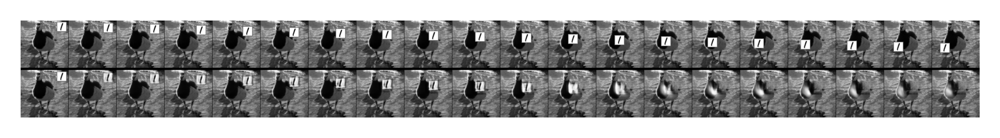

Data: min and max 5.9604645e-08 0.9636281


<b><span style="color: #ff0000">diffNet (N) (r)</span></b>  (1, 10, 128, 128, 1)

Image: min and max 0.0 0.4999999403953552


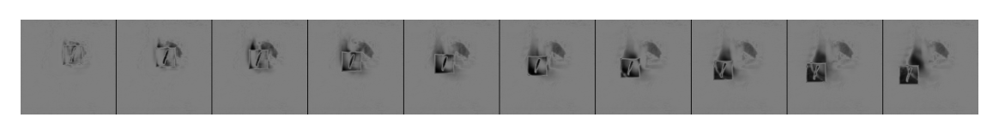

1 bceMin= 0.53342  bceNetFull= 0.55470  bceNet= 0.55470  L1Net= 0.03273  L2Net= 0.00758  SSIM= 0.90315
2 bceMin= 0.54645  bceNetFull= 0.56453  bceNet= 0.56453  L1Net= 0.02956  L2Net= 0.00627  SSIM= 0.90941
3 bceMin= 0.52691  bceNetFull= 0.54463  bceNet= 0.54463  L1Net= 0.03051  L2Net= 0.00621  SSIM= 0.91286
4 bceMin= 0.54186  bceNetFull= 0.56044  bceNet= 0.56044  L1Net= 0.03161  L2Net= 0.00652  SSIM= 0.90665
5 bceMin= 0.51625  bceNetFull= 0.53762  bceNet= 0.53762  L1Net= 0.03138  L2Net= 0.00739  SSIM= 0.90067
6 bceMin= 0.52055  bceNetFull= 0.54209  bceNet= 0.54209  L1Net= 0.03096  L2Net= 0.00767  SSIM= 0.90064
7 bceMin= 0.53241  bceNetFull= 0.55510  bceNet= 0.55510  L1Net= 0.03421  L2Net= 0.00795  SSIM= 0.89920
Number of Parameters =  31797
Data: min and max 0.0 0.99607843
Data[ 0 ]: min and max 0.0 0.99607843


<b><span style="color: #ff0000">GT,Pred (r)</span></b>  (1, 20, 262, 128, 1)

Image: min and max 0.0 1.0


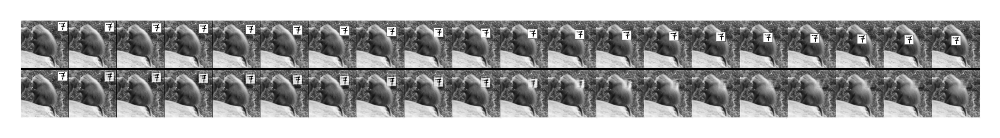

Data: min and max 1.1920929e-07 0.83173317


<b><span style="color: #ff0000">diffNet (N) (r)</span></b>  (1, 10, 128, 128, 1)

Image: min and max 0.0 0.4999999403953552


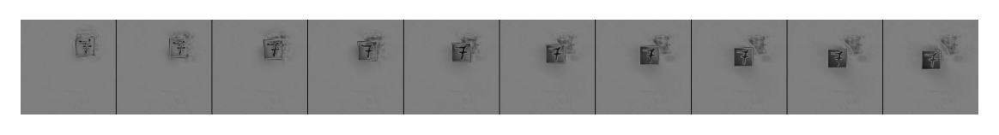

8 bceMin= 0.53435  bceNetFull= 0.55626  bceNet= 0.55626  L1Net= 0.03216  L2Net= 0.00777  SSIM= 0.90129
9 bceMin= 0.53843  bceNetFull= 0.55857  bceNet= 0.55857  L1Net= 0.03245  L2Net= 0.00728  SSIM= 0.90543
10 bceMin= 0.52515  bceNetFull= 0.54396  bceNet= 0.54396  L1Net= 0.02858  L2Net= 0.00642  SSIM= 0.90595
11 bceMin= 0.50311  bceNetFull= 0.52315  bceNet= 0.52315  L1Net= 0.03319  L2Net= 0.00695  SSIM= 0.90362
12 bceMin= 0.53274  bceNetFull= 0.55409  bceNet= 0.55409  L1Net= 0.03328  L2Net= 0.00788  SSIM= 0.90129
13 bceMin= 0.56160  bceNetFull= 0.58218  bceNet= 0.58218  L1Net= 0.03315  L2Net= 0.00737  SSIM= 0.89961
14 bceMin= 0.58436  bceNetFull= 0.60362  bceNet= 0.60362  L1Net= 0.03208  L2Net= 0.00693  SSIM= 0.90481
Number of Parameters =  31797
Data: min and max 0.0 0.99607843
Data[ 0 ]: min and max 0.0 0.99607843


<b><span style="color: #ff0000">GT,Pred (r)</span></b>  (1, 20, 262, 128, 1)

Image: min and max 0.0 1.0


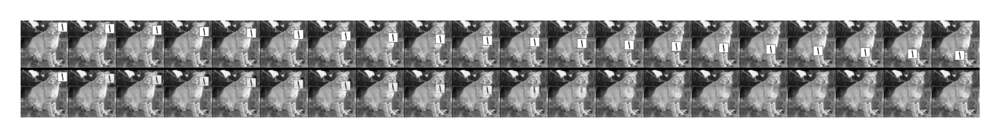

Data: min and max 0.0 0.8856664


<b><span style="color: #ff0000">diffNet (N) (r)</span></b>  (1, 10, 128, 128, 1)

Image: min and max 0.0 0.5


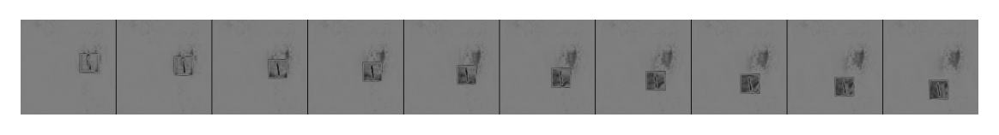

15 bceMin= 0.56212  bceNetFull= 0.58052  bceNet= 0.58052  L1Net= 0.03131  L2Net= 0.00660  SSIM= 0.90569
16 bceMin= 0.56912  bceNetFull= 0.58856  bceNet= 0.58856  L1Net= 0.03171  L2Net= 0.00698  SSIM= 0.90204
17 bceMin= 0.53638  bceNetFull= 0.55638  bceNet= 0.55638  L1Net= 0.03079  L2Net= 0.00695  SSIM= 0.90425
18 bceMin= 0.52808  bceNetFull= 0.54989  bceNet= 0.54989  L1Net= 0.03224  L2Net= 0.00786  SSIM= 0.90395
19 bceMin= 0.47282  bceNetFull= 0.49497  bceNet= 0.49497  L1Net= 0.03211  L2Net= 0.00762  SSIM= 0.89795
20 bceMin= 0.54835  bceNetFull= 0.57039  bceNet= 0.57039  L1Net= 0.03281  L2Net= 0.00800  SSIM= 0.90186
21 bceMin= 0.58055  bceNetFull= 0.59896  bceNet= 0.59896  L1Net= 0.02994  L2Net= 0.00661  SSIM= 0.90599
Number of Parameters =  31797
Data: min and max 0.0 0.99803925
Data[ 0 ]: min and max 0.0 0.99803925


<b><span style="color: #ff0000">GT,Pred (r)</span></b>  (1, 20, 262, 128, 1)

Image: min and max 0.0 1.0


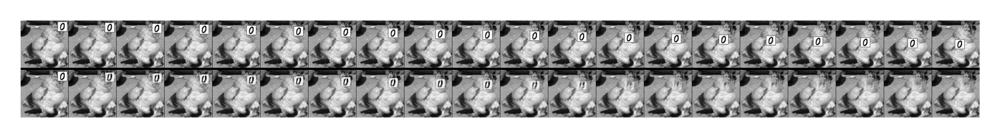

Data: min and max 1.1920929e-07 0.9201132


<b><span style="color: #ff0000">diffNet (N) (r)</span></b>  (1, 10, 128, 128, 1)

Image: min and max 0.0 0.4999999403953552


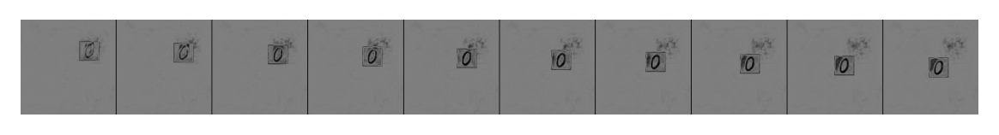

22 bceMin= 0.55455  bceNetFull= 0.57488  bceNet= 0.57488  L1Net= 0.03203  L2Net= 0.00734  SSIM= 0.90176
23 bceMin= 0.49459  bceNetFull= 0.51619  bceNet= 0.51619  L1Net= 0.03340  L2Net= 0.00754  SSIM= 0.89521
24 bceMin= 0.57905  bceNetFull= 0.59820  bceNet= 0.59820  L1Net= 0.03177  L2Net= 0.00698  SSIM= 0.90331
25 bceMin= 0.53102  bceNetFull= 0.55159  bceNet= 0.55159  L1Net= 0.03289  L2Net= 0.00730  SSIM= 0.90781
26 bceMin= 0.50879  bceNetFull= 0.53264  bceNet= 0.53264  L1Net= 0.03452  L2Net= 0.00853  SSIM= 0.90010
27 bceMin= 0.53643  bceNetFull= 0.55588  bceNet= 0.55588  L1Net= 0.03027  L2Net= 0.00677  SSIM= 0.89998
28 bceMin= 0.55086  bceNetFull= 0.57097  bceNet= 0.57097  L1Net= 0.03207  L2Net= 0.00713  SSIM= 0.90184
Number of Parameters =  31797
Data: min and max 0.0 1.0
Data[ 0 ]: min and max 0.0 1.0


<b><span style="color: #ff0000">GT,Pred (r)</span></b>  (1, 20, 262, 128, 1)

Image: min and max 0.0 1.0


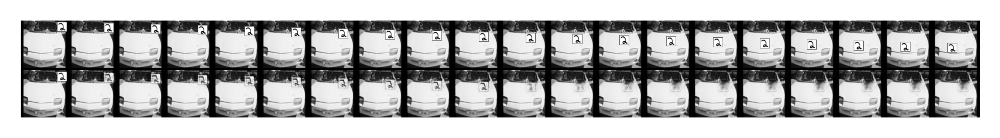

Data: min and max 2.0116568e-07 0.9409625


<b><span style="color: #ff0000">diffNet (N) (r)</span></b>  (1, 10, 128, 128, 1)

Image: min and max 0.0 0.49999988079071045


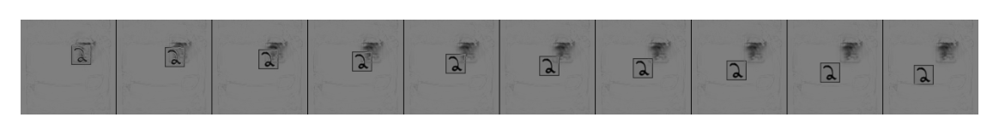

29 bceMin= 0.55438  bceNetFull= 0.57576  bceNet= 0.57576  L1Net= 0.03312  L2Net= 0.00770  SSIM= 0.90041
30 bceMin= 0.52372  bceNetFull= 0.54679  bceNet= 0.54679  L1Net= 0.03237  L2Net= 0.00795  SSIM= 0.90154
31 bceMin= 0.48641  bceNetFull= 0.50870  bceNet= 0.50870  L1Net= 0.03279  L2Net= 0.00813  SSIM= 0.90311
32 bceMin= 0.53456  bceNetFull= 0.55419  bceNet= 0.55419  L1Net= 0.03057  L2Net= 0.00707  SSIM= 0.90836
33 bceMin= 0.55071  bceNetFull= 0.56986  bceNet= 0.56986  L1Net= 0.03172  L2Net= 0.00675  SSIM= 0.90484
34 bceMin= 0.51258  bceNetFull= 0.53384  bceNet= 0.53384  L1Net= 0.03225  L2Net= 0.00757  SSIM= 0.89853
35 bceMin= 0.51232  bceNetFull= 0.53487  bceNet= 0.53487  L1Net= 0.03297  L2Net= 0.00793  SSIM= 0.89660
Number of Parameters =  31797
Data: min and max 0.0 1.0
Data[ 0 ]: min and max 0.0 1.0


<b><span style="color: #ff0000">GT,Pred (r)</span></b>  (1, 20, 262, 128, 1)

Image: min and max 0.0 1.0


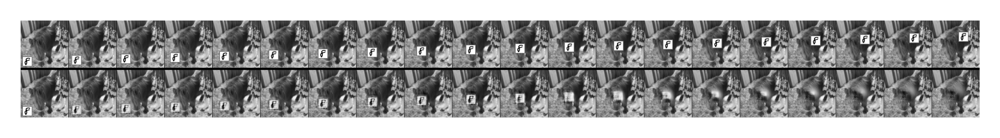

Data: min and max 1.7881393e-07 0.91437733


<b><span style="color: #ff0000">diffNet (N) (r)</span></b>  (1, 10, 128, 128, 1)

Image: min and max 0.0 0.49999988079071045


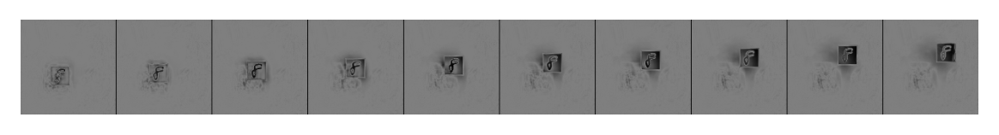

36 bceMin= 0.51864  bceNetFull= 0.53908  bceNet= 0.53908  L1Net= 0.03241  L2Net= 0.00733  SSIM= 0.90123
37 bceMin= 0.53400  bceNetFull= 0.55313  bceNet= 0.55313  L1Net= 0.03075  L2Net= 0.00655  SSIM= 0.90098
38 bceMin= 0.49125  bceNetFull= 0.51342  bceNet= 0.51342  L1Net= 0.03293  L2Net= 0.00761  SSIM= 0.90222
39 bceMin= 0.57023  bceNetFull= 0.59093  bceNet= 0.59093  L1Net= 0.03233  L2Net= 0.00753  SSIM= 0.90095
40 bceMin= 0.51364  bceNetFull= 0.53467  bceNet= 0.53467  L1Net= 0.03234  L2Net= 0.00755  SSIM= 0.90566
41 bceMin= 0.54337  bceNetFull= 0.56398  bceNet= 0.56398  L1Net= 0.03122  L2Net= 0.00740  SSIM= 0.90478
42 bceMin= 0.48230  bceNetFull= 0.50334  bceNet= 0.50334  L1Net= 0.03357  L2Net= 0.00730  SSIM= 0.90308
Number of Parameters =  31797
Data: min and max 0.0 1.0
Data[ 0 ]: min and max 0.0 1.0


<b><span style="color: #ff0000">GT,Pred (r)</span></b>  (1, 20, 262, 128, 1)

Image: min and max 0.0 1.0


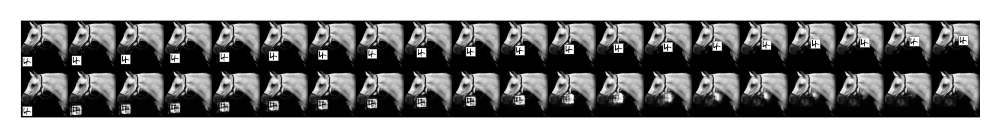

Data: min and max 5.066395e-07 0.97522503


<b><span style="color: #ff0000">diffNet (N) (r)</span></b>  (1, 10, 128, 128, 1)

Image: min and max 0.0 0.4999997615814209


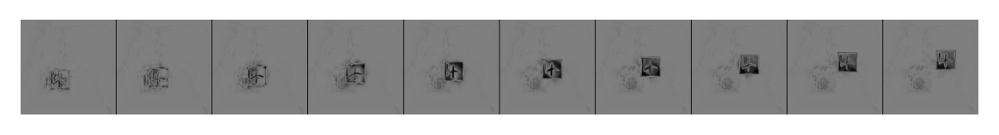

43 bceMin= 0.52962  bceNetFull= 0.55121  bceNet= 0.55121  L1Net= 0.03314  L2Net= 0.00776  SSIM= 0.90435
44 bceMin= 0.51745  bceNetFull= 0.53935  bceNet= 0.53935  L1Net= 0.03175  L2Net= 0.00787  SSIM= 0.89992
45 bceMin= 0.55676  bceNetFull= 0.57529  bceNet= 0.57529  L1Net= 0.02978  L2Net= 0.00663  SSIM= 0.90319
46 bceMin= 0.57293  bceNetFull= 0.59500  bceNet= 0.59500  L1Net= 0.03343  L2Net= 0.00820  SSIM= 0.90339
47 bceMin= 0.53854  bceNetFull= 0.55937  bceNet= 0.55937  L1Net= 0.03286  L2Net= 0.00748  SSIM= 0.90308
48 bceMin= 0.52743  bceNetFull= 0.54739  bceNet= 0.54739  L1Net= 0.03152  L2Net= 0.00702  SSIM= 0.90448
49 bceMin= 0.50134  bceNetFull= 0.52265  bceNet= 0.52265  L1Net= 0.03437  L2Net= 0.00761  SSIM= 0.90074
Number of Parameters =  31797
Data: min and max 0.0 1.0
Data[ 0 ]: min and max 0.0 1.0


<b><span style="color: #ff0000">GT,Pred (r)</span></b>  (1, 20, 262, 128, 1)

Image: min and max 0.0 1.0


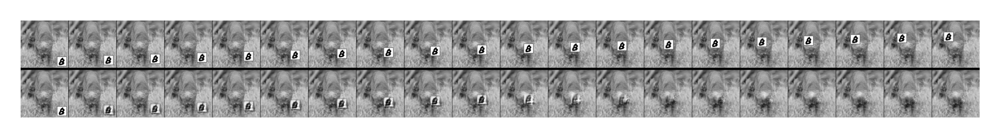

Data: min and max 2.682209e-07 0.8669124


<b><span style="color: #ff0000">diffNet (N) (r)</span></b>  (1, 10, 128, 128, 1)

Image: min and max 0.0 0.4999998211860657


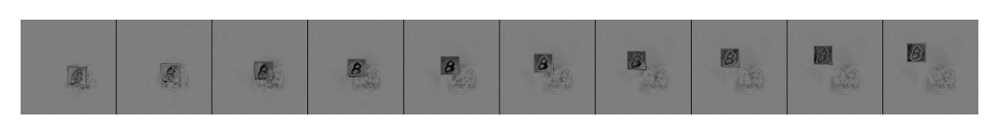

50 bceMin= 0.56907  bceNetFull= 0.59077  bceNet= 0.59077  L1Net= 0.03440  L2Net= 0.00801  SSIM= 0.90413
51 bceMin= 0.50407  bceNetFull= 0.52778  bceNet= 0.52778  L1Net= 0.03414  L2Net= 0.00871  SSIM= 0.90161
52 bceMin= 0.53890  bceNetFull= 0.55818  bceNet= 0.55818  L1Net= 0.03078  L2Net= 0.00668  SSIM= 0.90290
53 bceMin= 0.54044  bceNetFull= 0.56204  bceNet= 0.56204  L1Net= 0.03264  L2Net= 0.00780  SSIM= 0.90135
54 bceMin= 0.50806  bceNetFull= 0.53051  bceNet= 0.53051  L1Net= 0.03259  L2Net= 0.00800  SSIM= 0.89444
55 bceMin= 0.54636  bceNetFull= 0.56681  bceNet= 0.56681  L1Net= 0.03083  L2Net= 0.00730  SSIM= 0.90155
56 bceMin= 0.51117  bceNetFull= 0.53292  bceNet= 0.53292  L1Net= 0.03280  L2Net= 0.00759  SSIM= 0.89906
Number of Parameters =  31797
Data: min and max 0.0 1.0
Data[ 0 ]: min and max 0.0 1.0


<b><span style="color: #ff0000">GT,Pred (r)</span></b>  (1, 20, 262, 128, 1)

Image: min and max 0.0 1.0


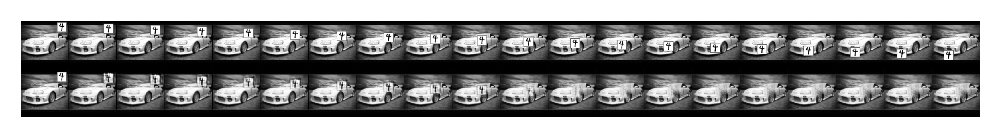

Data: min and max 5.9604645e-08 0.9764065


<b><span style="color: #ff0000">diffNet (N) (r)</span></b>  (1, 10, 128, 128, 1)

Image: min and max 0.0 0.4999999403953552


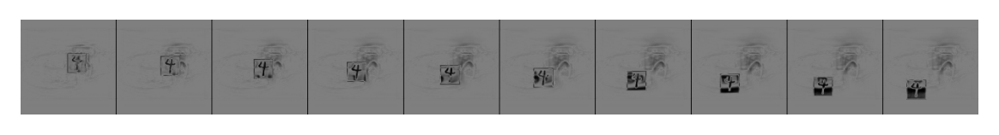

57 bceMin= 0.51527  bceNetFull= 0.53584  bceNet= 0.53584  L1Net= 0.03240  L2Net= 0.00755  SSIM= 0.90073
58 bceMin= 0.50062  bceNetFull= 0.52473  bceNet= 0.52473  L1Net= 0.03465  L2Net= 0.00859  SSIM= 0.90079
59 bceMin= 0.48487  bceNetFull= 0.50713  bceNet= 0.50713  L1Net= 0.03261  L2Net= 0.00737  SSIM= 0.89468
60 bceMin= 0.52477  bceNetFull= 0.54590  bceNet= 0.54590  L1Net= 0.03178  L2Net= 0.00731  SSIM= 0.90079
61 bceMin= 0.52783  bceNetFull= 0.54862  bceNet= 0.54862  L1Net= 0.03123  L2Net= 0.00737  SSIM= 0.90194
62 bceMin= 0.57863  bceNetFull= 0.59823  bceNet= 0.59823  L1Net= 0.03280  L2Net= 0.00714  SSIM= 0.89869
63 bceMin= 0.52077  bceNetFull= 0.54388  bceNet= 0.54388  L1Net= 0.03423  L2Net= 0.00801  SSIM= 0.90265
Number of Parameters =  31797
Data: min and max 0.0 0.99607843
Data[ 0 ]: min and max 0.0 0.99607843


<b><span style="color: #ff0000">GT,Pred (r)</span></b>  (1, 20, 262, 128, 1)

Image: min and max 0.0 1.0


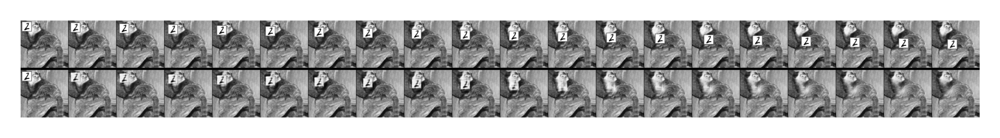

Data: min and max 4.172325e-07 0.85828936


<b><span style="color: #ff0000">diffNet (N) (r)</span></b>  (1, 10, 128, 128, 1)

Image: min and max 0.0 0.4999997615814209


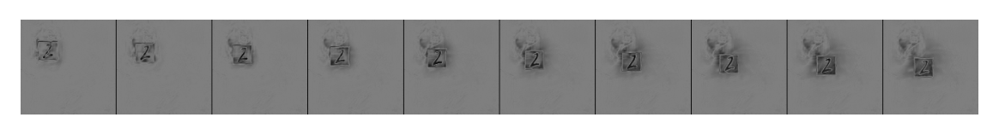

64 bceMin= 0.51663  bceNetFull= 0.53928  bceNet= 0.53928  L1Net= 0.03501  L2Net= 0.00799  SSIM= 0.88867
65 bceMin= 0.52921  bceNetFull= 0.54865  bceNet= 0.54865  L1Net= 0.03117  L2Net= 0.00693  SSIM= 0.90253
66 bceMin= 0.51043  bceNetFull= 0.53134  bceNet= 0.53134  L1Net= 0.03235  L2Net= 0.00743  SSIM= 0.90219
67 bceMin= 0.51369  bceNetFull= 0.53386  bceNet= 0.53386  L1Net= 0.03143  L2Net= 0.00718  SSIM= 0.90654
68 bceMin= 0.49722  bceNetFull= 0.51945  bceNet= 0.51945  L1Net= 0.03412  L2Net= 0.00776  SSIM= 0.90166
69 bceMin= 0.50713  bceNetFull= 0.52854  bceNet= 0.52854  L1Net= 0.03400  L2Net= 0.00748  SSIM= 0.90464
70 bceMin= 0.52158  bceNetFull= 0.54203  bceNet= 0.54203  L1Net= 0.03256  L2Net= 0.00729  SSIM= 0.90293
Number of Parameters =  31797
Data: min and max 0.0 0.9901961
Data[ 0 ]: min and max 0.0 0.9901961


<b><span style="color: #ff0000">GT,Pred (r)</span></b>  (1, 20, 262, 128, 1)

Image: min and max 0.0 1.0


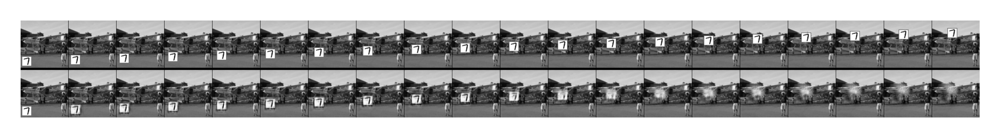

Data: min and max 2.3841858e-07 0.8518233


<b><span style="color: #ff0000">diffNet (N) (r)</span></b>  (1, 10, 128, 128, 1)

Image: min and max 0.0 0.49999988079071045


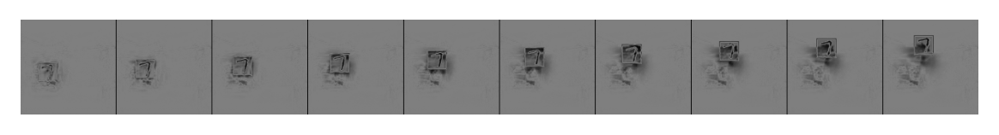

71 bceMin= 0.51426  bceNetFull= 0.53437  bceNet= 0.53437  L1Net= 0.03154  L2Net= 0.00725  SSIM= 0.90454
72 bceMin= 0.55286  bceNetFull= 0.57627  bceNet= 0.57627  L1Net= 0.03273  L2Net= 0.00813  SSIM= 0.90355
73 bceMin= 0.55250  bceNetFull= 0.57115  bceNet= 0.57115  L1Net= 0.02967  L2Net= 0.00670  SSIM= 0.90692
74 bceMin= 0.50477  bceNetFull= 0.52580  bceNet= 0.52580  L1Net= 0.03148  L2Net= 0.00725  SSIM= 0.90414
75 bceMin= 0.55368  bceNetFull= 0.57395  bceNet= 0.57395  L1Net= 0.03073  L2Net= 0.00721  SSIM= 0.90672
76 bceMin= 0.53124  bceNetFull= 0.55209  bceNet= 0.55209  L1Net= 0.03284  L2Net= 0.00759  SSIM= 0.89932
77 bceMin= 0.52554  bceNetFull= 0.54788  bceNet= 0.54788  L1Net= 0.03308  L2Net= 0.00779  SSIM= 0.90458
Number of Parameters =  31797
Data: min and max 0.0 1.0
Data[ 0 ]: min and max 0.0 1.0


<b><span style="color: #ff0000">GT,Pred (r)</span></b>  (1, 20, 262, 128, 1)

Image: min and max 0.0 1.0


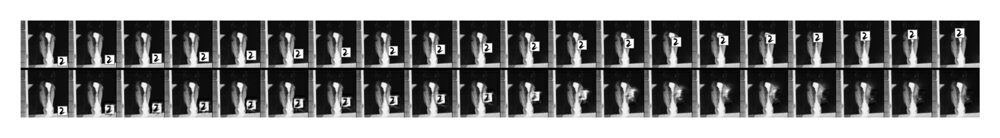

Data: min and max 5.9604645e-08 0.95759994


<b><span style="color: #ff0000">diffNet (N) (r)</span></b>  (1, 10, 128, 128, 1)

Image: min and max 0.0 0.4999999403953552


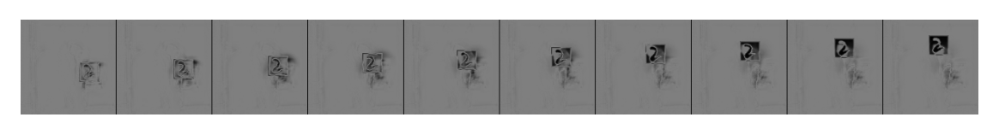

78 bceMin= 0.56644  bceNetFull= 0.58606  bceNet= 0.58606  L1Net= 0.03156  L2Net= 0.00691  SSIM= 0.90396
79 bceMin= 0.51314  bceNetFull= 0.53624  bceNet= 0.53624  L1Net= 0.03409  L2Net= 0.00801  SSIM= 0.90189
80 bceMin= 0.53089  bceNetFull= 0.55142  bceNet= 0.55142  L1Net= 0.03183  L2Net= 0.00719  SSIM= 0.90106
81 bceMin= 0.52490  bceNetFull= 0.54636  bceNet= 0.54636  L1Net= 0.03300  L2Net= 0.00778  SSIM= 0.90649
82 bceMin= 0.53629  bceNetFull= 0.55458  bceNet= 0.55458  L1Net= 0.03031  L2Net= 0.00647  SSIM= 0.90771
83 bceMin= 0.54799  bceNetFull= 0.56713  bceNet= 0.56713  L1Net= 0.03098  L2Net= 0.00682  SSIM= 0.90347
84 bceMin= 0.50284  bceNetFull= 0.52683  bceNet= 0.52683  L1Net= 0.03438  L2Net= 0.00874  SSIM= 0.89536
Number of Parameters =  31797
Data: min and max 0.0 1.0
Data[ 0 ]: min and max 0.0 1.0


<b><span style="color: #ff0000">GT,Pred (r)</span></b>  (1, 20, 262, 128, 1)

Image: min and max 0.0 1.0


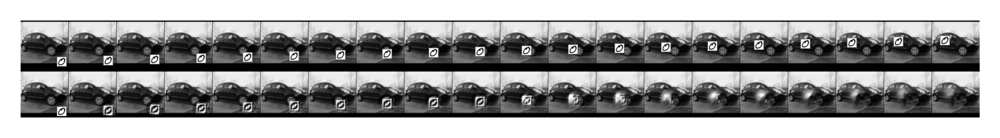

Data: min and max 4.7683716e-07 0.9400989


<b><span style="color: #ff0000">diffNet (N) (r)</span></b>  (1, 10, 128, 128, 1)

Image: min and max 0.0 0.4999997615814209


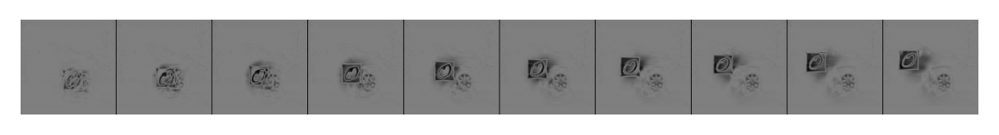

85 bceMin= 0.46553  bceNetFull= 0.49305  bceNet= 0.49305  L1Net= 0.03406  L2Net= 0.00911  SSIM= 0.90255
86 bceMin= 0.50133  bceNetFull= 0.52547  bceNet= 0.52547  L1Net= 0.03264  L2Net= 0.00879  SSIM= 0.90156
87 bceMin= 0.48084  bceNetFull= 0.50529  bceNet= 0.50529  L1Net= 0.03452  L2Net= 0.00854  SSIM= 0.89985
88 bceMin= 0.53993  bceNetFull= 0.55808  bceNet= 0.55808  L1Net= 0.02989  L2Net= 0.00640  SSIM= 0.90538
89 bceMin= 0.56856  bceNetFull= 0.58887  bceNet= 0.58887  L1Net= 0.03314  L2Net= 0.00742  SSIM= 0.90037
90 bceMin= 0.51280  bceNetFull= 0.53329  bceNet= 0.53329  L1Net= 0.03189  L2Net= 0.00716  SSIM= 0.90378
91 bceMin= 0.53712  bceNetFull= 0.55690  bceNet= 0.55690  L1Net= 0.03025  L2Net= 0.00697  SSIM= 0.89745
Number of Parameters =  31797
Data: min and max 0.0 0.9892157
Data[ 0 ]: min and max 0.0 0.9892157


<b><span style="color: #ff0000">GT,Pred (r)</span></b>  (1, 20, 262, 128, 1)

Image: min and max 0.0 1.0


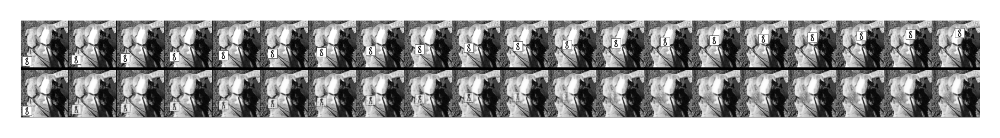

Data: min and max 3.2782555e-07 0.9692485


<b><span style="color: #ff0000">diffNet (N) (r)</span></b>  (1, 10, 128, 128, 1)

Image: min and max 0.0 0.4999998211860657


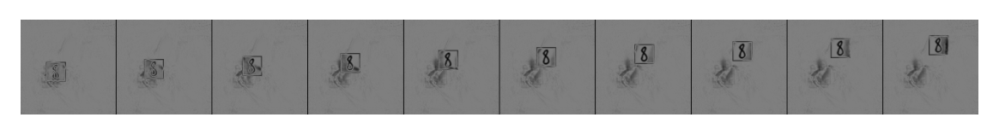

92 bceMin= 0.51611  bceNetFull= 0.53847  bceNet= 0.53847  L1Net= 0.03352  L2Net= 0.00781  SSIM= 0.90518
93 bceMin= 0.55012  bceNetFull= 0.56990  bceNet= 0.56990  L1Net= 0.03151  L2Net= 0.00722  SSIM= 0.90705
94 bceMin= 0.54163  bceNetFull= 0.56458  bceNet= 0.56458  L1Net= 0.03256  L2Net= 0.00823  SSIM= 0.90426
95 bceMin= 0.53845  bceNetFull= 0.56154  bceNet= 0.56154  L1Net= 0.03370  L2Net= 0.00823  SSIM= 0.89918
96 bceMin= 0.54645  bceNetFull= 0.56784  bceNet= 0.56784  L1Net= 0.03304  L2Net= 0.00763  SSIM= 0.90773
97 bceMin= 0.53372  bceNetFull= 0.55478  bceNet= 0.55478  L1Net= 0.03185  L2Net= 0.00748  SSIM= 0.90073
98 bceMin= 0.50664  bceNetFull= 0.52731  bceNet= 0.52731  L1Net= 0.03156  L2Net= 0.00712  SSIM= 0.90118
Number of Parameters =  31797
Data: min and max 0.0 1.0
Data[ 0 ]: min and max 0.0 1.0


<b><span style="color: #ff0000">GT,Pred (r)</span></b>  (1, 20, 262, 128, 1)

Image: min and max 0.0 1.0


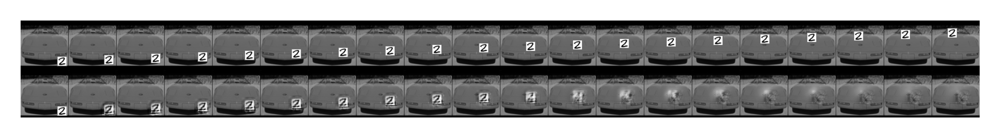

Data: min and max 1.1920929e-07 0.7950775


<b><span style="color: #ff0000">diffNet (N) (r)</span></b>  (1, 10, 128, 128, 1)

Image: min and max 0.0 0.4999999403953552


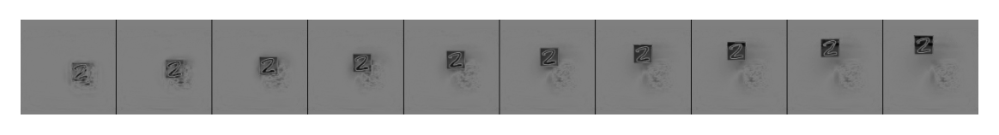

99 bceMin= 0.48639  bceNetFull= 0.51029  bceNet= 0.51029  L1Net= 0.03403  L2Net= 0.00874  SSIM= 0.90269
100 bceMin= 0.51263  bceNetFull= 0.53434  bceNet= 0.53434  L1Net= 0.03317  L2Net= 0.00759  SSIM= 0.90488
BCEMin= 0.5292342024864537  BCE= 0.5502873195870088  L1= 0.03229920623252298  L2= 0.0074710246719567495  SSIM= 0.9024608985032185


BaseException: end here

In [6]:
if infrencePhase:
    rand.seed(1);np.random.seed(1);t=0;infrenceRes=[]
if infrencePhase:
    paintEvery=7
else:
    paintEvery=300
saveEvery=1000
if infrencePhase:
    bs=10
else:
    bs=10

if infrencePhase:
    runs=100
else:
    runs=2000000
    
    
torch.set_grad_enabled(not infrencePhase)    
ds_loader = DataLoader(ds,batch_size=bs, shuffle=not infrencePhase,num_workers=8,worker_init_fn=worker_init_fn)
ds_iter=iter(ds_loader)
while t <= runs:
    if(t%1==0):
        try:
            s=next(ds_iter)
        except StopIteration:
            ds_iter=iter(ds_loader)
            s=next(ds_iter)
        
        dataSet=s['GT'].to(avDev)
        dsBG=s['BG'].to(avDev)
        dsFG=s['FG'].to(avDev)
        dsAlpha=s['A'].to(avDev)
        dsVel=s["velocity"]
        
    if  t>0 and t%saveEvery==0:
        save_model(theNotebook+str(t//saveEvery))
    dataSetCTarget = None
    dataSet=padDS(dataSet)
    temp_ds = dataSet.float().permute(0,2,3,4,1).contiguous()
    batch_ds = temp_ds.requires_grad_()

    if(len(cuda_devices)>0):
        with torch.cuda.device(cuda_devices[0]):
                batch_ds=batch_ds.cuda()
    pre_frames_batch=model(batch_ds[:,0:seqLength,:,:,:])
    optimizer.zero_grad()

    netOut = pre_frames_batch[:,seedNumber:,:,:,:]
    target = batch_ds[:,seedNumber:,:,:,:].detach()
    
    bceNetFull = critBCE(pre_frames_batch[:,seedNumber:,:,:,:],batch_ds[:,seedNumber:,:,:,:].detach()) 
    
    bceNet=critBCE(netOut,target) 
    bceMin=critBCE(target,target)
    L1NetDiff = (netOut-target).abs()
    L1Net=L1NetDiff.mean()
    L2Net=critL2(netOut,target)
    ssimL=ssim(netOut.reshape(netOut.shape[0]*netOut.shape[1],1,netOut.shape[2],netOut.shape[3]), target.reshape(target.shape[0]*target.shape[1],1,target.shape[2],target.shape[3]))

    print(t,"bceMin=","%0.5f" %bceMin.item()," bceNetFull=","%0.5f" %bceNetFull.item()," bceNet=","%0.5f" %bceNet.item()," L1Net=","%0.5f" %L1Net.item()," L2Net=","%0.5f" %L2Net.item(), " SSIM=","%0.5f" %ssimL)
#     writer.add_scalar("bceNetFull",bceNetFull.item(),t);writer.add_scalar("bceNet",bceNet.item(),t);writer.add_scalar("L1Net",L1Net.item(),t);writer.add_scalar("L2Net",L2Net.item(),t);
    
    if not infrencePhase:
        bceNetFull.backward()
        optimizer.step()
    else:
        infrenceRes.append([bceMin.item(),bceNet.item(),L1Net.item(),L2Net.item(),ssimL.item()])
        
    if t%paintEvery==0:
        r1=5
        r2=min(bs,6)
        print("Number of Parameters = ",sum(p.numel() for p in model.parameters() if p.requires_grad))
        showSeq(False,t,"GT,Pred",batch_ds[r1:r2].permute(0,4,1,2,3).cpu(),[(pre_frames_batch.permute(0,4,1,2,3).data[r1:r2]).cpu()],oneD=(dimention==1),revert=True,dpi=3)
        showSeq(True,t,"diffNet",L1NetDiff.permute(0,4,1,2,3).detach()[r1:r2].cpu(),oneD=dimention==1,revert=True)

    t=t+1

    if(infrencePhase and t>runs):
        infrenceRes=np.array(infrenceRes)
        print("BCEMin=",infrenceRes[:,0].mean()," BCE=",infrenceRes[:,1].mean()," L1=",infrenceRes[:,2].mean()," L2=",infrenceRes[:,3].mean()," SSIM=",infrenceRes[:,4].mean())
        raise BaseException("end here")

In [10]:
save_model("PGPBest")

Model saved  2020-02-21 11:09:41.219986PGPBest.th
